In [20]:
from math import *
import matplotlib.cm as cm
from matplotlib.patches import Rectangle
from matplotlib.transforms import Affine2D


## Matrix Class



In [73]:
class matrix:
    
    # implements basic operations of a matrix class
    
    def __init__(self, value):
        self.value = value
        self.dimx = len(value)
        if isinstance(value[0], list):
            self.dimy = len(value[0])
        else:
            self.dimy = 1
            self.value = []
            for i in range(self.dimx):
                self.value.append([value[i]])

        print("Matrix[", self.dimx, ",", self.dimy,"] is Created:\n\t", self.value)
        
    
    def zero(self, dimx, dimy):
        # check if valid dimensions
        if dimx < 1 or dimy < 1:
            raise(ValueError, "invalid size of matrix")
        else:
            self.dimx = dimx
            self.dimy = dimy
            self.value = [[0 for row in range(dimy)] for col in range(dimx)]
    
    def identity(self, dim):
        # check if valid dimension
        if dim < 1:
            raise(ValueError, "Invalid size of matrix")
        else:
            self.dimx = dim
            self.dimy = dim
            self.value = [[0 for row in range(dim)] for col in range(dim)]
            for i in range(dim):
                self.value[i][i] = 1
    
    def show(self):
        for i in range(self.dimx):
            print(self.value[i])
        print(' ')
    
    def __add__(self, other):
        # check if correct dimensions
        if self.dimx != other.dimx or self.dimy != other.dimy:
            raise(ValueError, "Matrices must be of equal dimensions to add")
        else:
            # add if correct dimensions
            res = matrix([[]])
            res.zero(self.dimx, self.dimy)
            for i in range(self.dimx):
                for j in range(self.dimy):
                    res.value[i][j] = self.value[i][j] + other.value[i][j]
            return res
    
    def __sub__(self, other):
        # check if correct dimensions
        if self.dimx != other.dimx or self.dimy != other.dimy:
            raise(ValueError, "Matrices must be of equal dimensions to subtract")
        else:
            # subtract if correct dimensions
            res = matrix([[]])
            res.zero(self.dimx, self.dimy)
            for i in range(self.dimx):
                for j in range(self.dimy):
                    res.value[i][j] = self.value[i][j] - other.value[i][j]
            return res
    
    def __mul__(self, other):
        # check if correct dimensions
        if self.dimy != other.dimx:
            raise(ValueError, "Matrices must be m*n and n*p to multiply")
        else:
            # subtract if correct dimensions
            res = matrix([[]])
            res.zero(self.dimx, other.dimy)
            for i in range(self.dimx):
                for j in range(other.dimy):
                    for k in range(self.dimy):
                        res.value[i][j] += self.value[i][k] * other.value[k][j]
            return res
    
    def transpose(self):
        # compute transpose
        res = matrix([[]])
        res.zero(self.dimy, self.dimx)
        for i in range(self.dimx):
            for j in range(self.dimy):
                res.value[j][i] = self.value[i][j]
        return res
    
    # Thanks to Ernesto P. Adorio for use of Cholesky and CholeskyInverse functions
    
    def Cholesky(self, ztol=1.0e-5):
        # Computes the upper triangular Cholesky factorization of
        # a positive definite matrix.
        res = matrix([[]])
        res.zero(self.dimx, self.dimx)
        
        for i in range(self.dimx):
            S = sum([(res.value[k][i])**2 for k in range(i)])
            d = self.value[i][i] - S
            if abs(d) < ztol:
                res.value[i][i] = 0.0
            else:
                if d < 0.0:
                    raise(ValueError, "Matrix not positive-definite")
                res.value[i][i] = sqrt(d)
            for j in range(i+1, self.dimx):
                S = sum([res.value[k][i] * res.value[k][j] for k in range(self.dimx)])
                if abs(S) < ztol:
                    S = 0.0
                try:
                   res.value[i][j] = (self.value[i][j] - S)/res.value[i][i]
                except:
                   raise(ValueError, "Zero diagonal")
        return res
    
    def CholeskyInverse(self):
        # Computes inverse of matrix given its Cholesky upper Triangular
        # decomposition of matrix.
        res = matrix([[]])
        res.zero(self.dimx, self.dimx)
        
        # Backward step for inverse.
        for j in reversed(range(self.dimx)):
            tjj = self.value[j][j]
            S = sum([self.value[j][k]*res.value[j][k] for k in range(j+1, self.dimx)])
            res.value[j][j] = 1.0/tjj**2 - S/tjj
            for i in reversed(range(j)):
                res.value[j][i] = res.value[i][j] = -sum([self.value[i][k]*res.value[k][j] for k in range(i+1, self.dimx)])/self.value[i][i]
        return res
    
    def inverse(self):
        aux = self.Cholesky()
        res = aux.CholeskyInverse()
        return res
    
    def __repr__(self):
        return repr(self.value)

## Vehicle Class

In [21]:
import random
import math

from math import pi

class Vehicle:
    def __init__(self, v, w, dt):
        self._v = v
        self._w = w
        self._dt = dt
        self._x_init = 0.0
        self._y_init = 0.0
        self._theta_init = 0.0
        self._x = 0.0
        self._y = 0.0
        self._theta = 0.0
        self._vx = 0.0
        self._vy = 0.0
        self._truck_width = 7.0
        self._truck_length= 12.0

        self._pos_noise = 1.0
        self._theta_noise = 0.05

        print("theta/dt = ", 180*(w * dt)/pi)

    
    def InitPosition(self, x, y, theta):
        self._x_init = x
        self._y_init = y
        self._theta_init = theta
        self._x = x
        self._y = y
        self._theta = theta

        self._true_x = x
        self._true_y = y
        self._true_theta = theta
    
    def SetNoise(self, pos_noise, theta_noise):
        self._pos_noise = pos_noise
        self._theta_noise = theta_noise
    
    def ChangeVelocity(self, v):
        self._v = v
    
    def ChangeAngularVelocity(self, w):
        self._w = w

    def UpdateOneStep(self):
        theta = self._theta
        self._true_theta = self._true_theta + self._w * self._dt
        self._theta = self._theta + self._w * self._dt + random.uniform(-self._theta_noise, self._theta_noise)

        self._vx = self._v * cos(theta)
        self._vy = self._v * sin(theta)
        self._true_vx = self._v * cos(self._true_theta)
        self._true_vy = self._v * sin(self._true_theta)

        self._true_x = self._true_x + self._true_vx * self._dt
        self._true_y = self._true_y + self._true_vy * self._dt
        self._x = self._true_x + self._vx * self._dt + random.uniform(-self._pos_noise, self._pos_noise)
        self._y = self._true_y + self._vy * self._dt + random.uniform(-self._pos_noise, self._pos_noise)

        return [self._x,self._y,self._theta], [self._true_x, self._true_y, self._true_theta]
    
    def RelativeRectangle(self, width, height, center_tf, **kwargs):
        rect_origin_to_center = Affine2D().translate(width/2 , height/2)
        #print(rect_origin_to_center)
        return(Rectangle((0,0), width, height, transform=rect_origin_to_center.inverted() + center_tf, **kwargs))
        #return(Rectangle((0,0), width, height, transform=center_tf, **kwargs))


    def PlotCurrentVehiclePosition(self, ax, **kwargs):
        ax.scatter( self._true_x, self._true_y, color="black" )

        truck_x = self._true_x
        truck_y = self._true_y
        truck_theta = self._true_theta

        rect_center_x = truck_x + self._truck_length * 0.25 * cos(truck_theta)
        rect_center_y = truck_y + self._truck_length * 0.25 * sin(truck_theta)

        to_rear_axle_tf = Affine2D().rotate(truck_theta - radians(90)).translate(truck_x, truck_y) + ax.transData
        to_body_center_tf = Affine2D().rotate(truck_theta - radians(90)).translate(rect_center_x,rect_center_y) + ax.transData
        body = self.RelativeRectangle(self._truck_width, self._truck_length, to_body_center_tf, edgecolor="black", facecolor="Yellow", **kwargs)

        tyre_width = 1.0
        tyre_length = 3.0
        front_tyre_pos_x = 0.3 * self._truck_width
        front_tyre_pos_y = 0.4 * self._truck_length
        tyre_base_angle = 0
        body_center_to_left_front_tf = Affine2D().rotate(radians(tyre_base_angle)).translate( -0.4*self._truck_width, 0.5*self._truck_length) # ステアを切る場合はrotateをいじる
        body_center_to_right_front_tf = Affine2D().rotate(radians(tyre_base_angle)).translate(0.4*self._truck_width,  0.5*self._truck_length)

        body_center_to_left_rear_tf = Affine2D().rotate(radians(tyre_base_angle)).translate( -0.4*self._truck_width, 0)
        body_center_to_right_rear_tf = Affine2D().rotate(radians(tyre_base_angle)).translate( 0.4*self._truck_width, 0)

        body_center_to_cab_tf = Affine2D().rotate(radians(tyre_base_angle)).translate( -0.3*self._truck_width, 0.6*self._truck_length)

        #left_front_wheel = self.RelativeRectangle( tyre_width, tyre_length, body_center_to_left_front_tf   + to_rear_axle_tf, facecolor="black", edgecolor="black", **kwargs)
        #right_front_wheel = self.RelativeRectangle( tyre_width, tyre_length, body_center_to_right_front_tf + to_rear_axle_tf, facecolor="black", edgecolor="black", **kwargs)

        cab = self.RelativeRectangle( 2.0, 2.0, body_center_to_cab_tf + to_rear_axle_tf, facecolor="blue", edgecolor="black", **kwargs)

        left_rear_wheel = self.RelativeRectangle( tyre_width, tyre_length, body_center_to_left_rear_tf     + to_rear_axle_tf, facecolor="black", edgecolor="black", **kwargs)
        right_rear_wheel = self.RelativeRectangle( tyre_width, tyre_length, body_center_to_right_rear_tf   + to_rear_axle_tf, facecolor="black", edgecolor="black", **kwargs)

        #ax.add_patch(left_front_wheel)
        #ax.add_patch(right_front_wheel)
        ax.add_patch(left_rear_wheel)
        ax.add_patch(right_rear_wheel)
        ax.add_patch(body)
        ax.add_patch(cab)


        


        



## Error Ellipse

In [4]:
import numpy as np

class ErrorEllipse2D:
    def __init__(self, error_mat, kaisq):
        self.error_mat = error_mat
        if error_mat.value[0][0] > error_mat.value[1][1]:
            self.ramda1 = error_mat.value[0][0]
            self.ramda2 = error_mat.value[1][1]
        else:
            self.ramda1 = error_mat.value[1][1]
            self.ramda2 = error_mat.value[0][0]

        self.SetKaiSQParam(kaisq)

        #print(self.ramda1,",",self.ramda2,",",self.kaisq)
    
    def SetKaiSQParam(self, kaisq):
        self.kaisq = kaisq

    def GetEllipseParam(self):
        a = sqrt(self.kaisq * self.ramda1)
        b = sqrt(self.kaisq * self.ramda2)
        return(a,b)
    
    def GetEllipsePoints(self):
        a,b = self.GetEllipseParam()

        theta = np.linspace(0, 2*np.pi, 60)

        x = a * np.cos(theta)
        y = b * np.sin(theta)

        return(x,y)


## My Enigma sample

Q: [[1.0000000e-02 0.0000000e+00 0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 1.0000000e-02 0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 3.0461742e-04 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00]]
R: [[1.         0.        ]
 [0.         0.48738787]]
Qsim: [[0.25 0.  ]
 [0.   0.25]]
Rsim: [[1.         0.        ]
 [0.         0.27415568]]


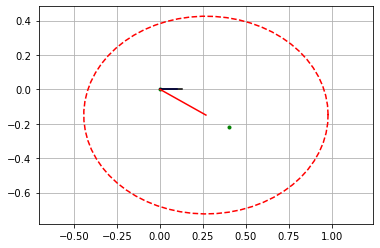

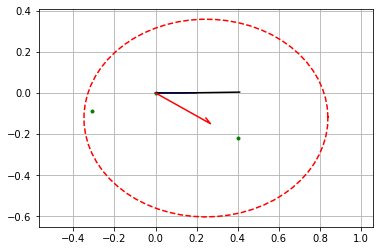

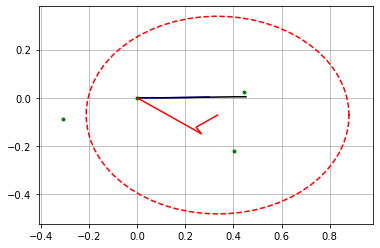

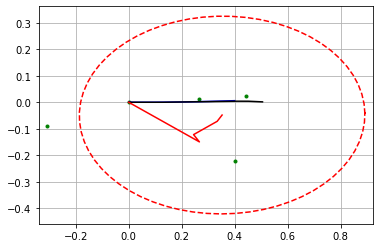

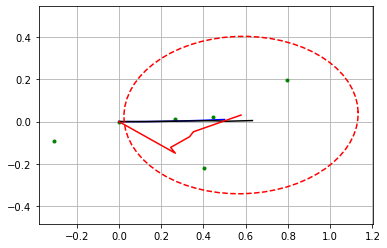

...

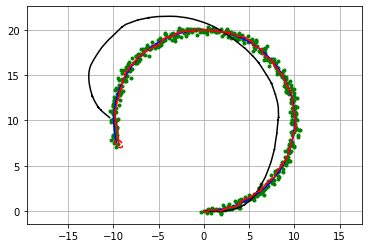

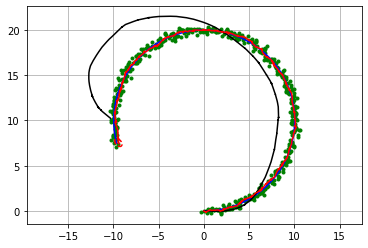

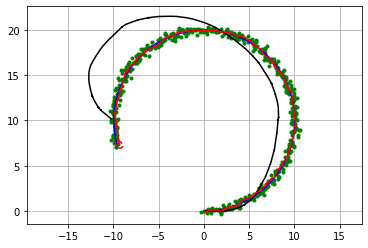

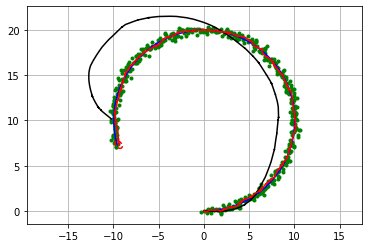

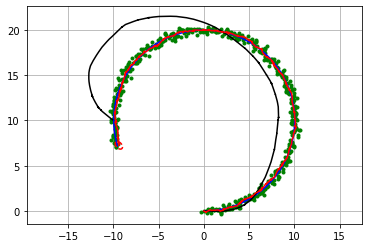

In [5]:
"""

Extended kalman filter (EKF) localization sample

author: Atsushi Sakai (@Atsushi_twi)

"""

import numpy as np
import math
import matplotlib.pyplot as plt

# Estimation parameter of EKF
Q = np.diag([0.1, 0.1, math.radians(1.0), 1.0])**2
print("Q:", Q)
R = np.diag([1.0, math.radians(40.0)])**2
print("R:", R)

#  Simulation parameter
Qsim = np.diag([0.5, 0.5])**2
print("Qsim:", Qsim)
Rsim = np.diag([1.0, math.radians(30.0)])**2
print("Rsim:", Rsim)

DT = 0.1  # time tick [s]
SIM_TIME = 50.0  # simulation time [s]

show_animation = True


def calc_input():
    v = 1.0  # [m/s]
    yawrate = 0.1  # [rad/s]
    u = np.matrix([v, yawrate]).T
    return u


def observation(xTrue, xd, u):

    xTrue = motion_model(xTrue, u)

    # add noise to gps x-y
    zx = xTrue[0, 0] + np.random.randn() * Qsim[0, 0]
    zy = xTrue[1, 0] + np.random.randn() * Qsim[1, 1]
    z = np.matrix([zx, zy])

    # add noise to input
    ud1 = u[0, 0] + np.random.randn() * Rsim[0, 0]
    ud2 = u[1, 0] + np.random.randn() * Rsim[1, 1]
    ud = np.matrix([ud1, ud2]).T

    xd = motion_model(xd, ud)

    return xTrue, z, xd, ud

def motion_model(x, u):

    F = np.matrix([[1.0, 0, 0, 0],
                   [0, 1.0, 0, 0],
                   [0, 0, 1.0, 0],
                   [0, 0, 0, 0]])

    B = np.matrix([[DT * math.cos(x[2, 0]), 0],
                   [DT * math.sin(x[2, 0]), 0],
                   [0.0, DT],
                   [1.0, 0.0]])

    x = F * x + B * u

    return x


def observation_model(x):
    #  Observation Model
    H = np.matrix([
        [1, 0, 0, 0],
        [0, 1, 0, 0]
    ])

    z = H * x

    return z


def jacobF(x, u):
    """
    Jacobian of Motion Model
    motion model
    x_{t+1} = x_t+v*dt*cos(yaw)
    y_{t+1} = y_t+v*dt*sin(yaw)
    yaw_{t+1} = yaw_t+omega*dt
    v_{t+1} = v{t}
    so
    dx/dyaw = -v*dt*sin(yaw)
    dx/dv = dt*cos(yaw)
    dy/dyaw = v*dt*cos(yaw)
    dy/dv = dt*sin(yaw)
    """
    yaw = x[2, 0]
    v = u[0, 0]
    jF = np.matrix([
        [1.0, 0.0, -DT * v * math.sin(yaw), DT * math.cos(yaw)],
        [0.0, 1.0, DT * v * math.cos(yaw), DT * math.sin(yaw)],
        [0.0, 0.0, 1.0, 0.0],
        [0.0, 0.0, 0.0, 1.0]])

    return jF


def jacobH(x):
    # Jacobian of Observation Model
    jH = np.matrix([
        [1, 0, 0, 0],
        [0, 1, 0, 0]
    ])

    return jH


def ekf_estimation(xEst, PEst, z, u):

    #  Predict
    xPred = motion_model(xEst, u)
    jF = jacobF(xPred, u)
    PPred = jF * PEst * jF.T + Q

    #  Update
    jH = jacobH(xPred)
    zPred = observation_model(xPred)
    y = z.T - zPred
    S = jH * PPred * jH.T + R
    K = PPred * jH.T * np.linalg.inv(S)
    xEst = xPred + K * y
    PEst = (np.eye(len(xEst)) - K * jH) * PPred

    return xEst, PEst


def plot_covariance_ellipse(xEst, PEst):
    Pxy = PEst[0:2, 0:2]
    eigval, eigvec = np.linalg.eig(Pxy)

    if eigval[0] >= eigval[1]:
        bigind = 0
        smallind = 1
    else:
        bigind = 1
        smallind = 0

    t = np.arange(0, 2 * math.pi + 0.1, 0.1)
    a = math.sqrt(eigval[bigind])
    b = math.sqrt(eigval[smallind])
    x = [a * math.cos(it) for it in t]
    y = [b * math.sin(it) for it in t]
    angle = math.atan2(eigvec[bigind, 1], eigvec[bigind, 0])
    R = np.matrix([[math.cos(angle), math.sin(angle)],
                   [-math.sin(angle), math.cos(angle)]])
    fx = R * np.matrix([x, y])
    px = np.array(fx[0, :] + xEst[0, 0]).flatten()
    py = np.array(fx[1, :] + xEst[1, 0]).flatten()
    plt.plot(px, py, "--r")


def main():
    #print(__file__ + " start!!")

    time = 0.0

    # State Vector [x y yaw v]'
    xEst = np.matrix(np.zeros((4, 1)))
    xTrue = np.matrix(np.zeros((4, 1)))
    PEst = np.eye(4)

    xDR = np.matrix(np.zeros((4, 1)))  # Dead reckoning

    # history
    hxEst = xEst
    hxTrue = xTrue
    hxDR = xTrue
    hz = np.zeros((1, 2))

    while SIM_TIME >= time:
        time += DT
        u = calc_input()

        xTrue, z, xDR, ud = observation(xTrue, xDR, u)

        xEst, PEst = ekf_estimation(xEst, PEst, z, ud)

        # store data history
        hxEst = np.hstack((hxEst, xEst))
        hxDR = np.hstack((hxDR, xDR))
        hxTrue = np.hstack((hxTrue, xTrue))
        hz = np.vstack((hz, z))

        if show_animation:
            plt.cla()
            plt.plot(hz[:, 0], hz[:, 1], ".g")
            plt.plot(np.array(hxTrue[0, :]).flatten(),
                     np.array(hxTrue[1, :]).flatten(), "-b")
            plt.plot(np.array(hxDR[0, :]).flatten(),
                     np.array(hxDR[1, :]).flatten(), "-k")
            plt.plot(np.array(hxEst[0, :]).flatten(),
                     np.array(hxEst[1, :]).flatten(), "-r")
            plot_covariance_ellipse(xEst, PEst)
            plt.axis("equal")
            plt.grid(True)
            plt.pause(0.001)


if __name__ == '__main__':
    main()

## EKF Other Sample


In [1]:

import numpy as np

def limit_angle(angle_in):
    '''角度範囲補正処理
        角度を-π～πの範囲に補正する
    引数：
        angle_in：補正前角度[rad]
    返り値：
        angle_out：補正後角度[rad]
    '''
    angle_out = np.absolute(angle_in)
    while angle_out > np.pi:
        angle_out -= np.pi * 2

    if angle_in < 0:
        angle_out *= -1

    return angle_out

In [2]:

import numpy as np
import matplotlib.pyplot as plt

BASE_ANG = np.pi / 2.0

def world2robot(origin, world):
    """ワールド座標系→ロボット座標系変換
    引数：
        origin：変換原点位置（ベクトル）
            origin[0, 0]：x座標
            origin[1, 0]：y座標
            origin[2, 0]：方角(rad)
        world：ワールド座標（ベクトル）
            world[n, 0]：x座標
            world[n, 1]：y座標
            n:要素数
    返り値：
        robot：ロボット座標（ベクトル）
            robot[n, 0]：x座標
            robot[n, 1]：y座標
            n:要素数
    """
    yaw = BASE_ANG - origin[2, 0]
    diff = world - origin.T[0, 0:2]
    rot = np.array([[np.cos(yaw), -np.sin(yaw)],
                    [np.sin(yaw), np.cos(yaw) ]])
    robot = (rot @ diff.T).T
    return robot

def robot2world(origin, robot):
    """ローカル座標系→ワールド座標系変換
    引数：
        origin：変換原点位置（ベクトル）
            origin[0, 0]：x座標
            origin[1, 0]：y座標
            origin[2, 0]：方角(rad)
        robot：ロボット座標（ベクトル）
            robot[n, 0]：x座標
            robot[n, 1]：y座標
            n:要素数
    返り値：
        world：ワールド座標（ベクトル）
            world[n, 0]：x座標
            world[n, 1]：y座標
            n:要素数
    """
    yaw = origin[2, 0] - BASE_ANG
    rot = np.array([[np.cos(yaw), -np.sin(yaw)],
                    [np.sin(yaw), np.cos(yaw) ]])
    world = (rot @ robot.T).T + origin.T[0, 0:2]
    return world

In [3]:

import numpy as np
from scipy import interpolate as sp
from matplotlib import patches
import matplotlib.pyplot as plt

class ErrorEllipse(object):
    '''誤差楕円'''

    def __init__(self, p):
        '''コンストラクタ
        引数：
            p：上側累積パーセント点(2自由)
        '''
        # 上側累積パーセント点マップ[%]
        self.p = np.array([99.9, 99.5, 99, 98.5, 98, 97.5, 97, 96, 95, 94, 93, 92, 91, 90, 85, 80, 75, 70, 65, 60, 55,
                           50, 45, 40, 35, 30, 25, 20, 15, 10, 9, 8, 7, 6, 5, 4, 3, 2.5, 2, 1.5, 1, 0.5, 0])
        # カイの二乗値マップ
        self.square_x = np.array([13.81551056, 10.59663473, 9.210340372, 8.399410156, 7.824046011, 7.377758908,
                                  7.013115795, 6.43775165, 5.991464547, 5.626821434, 5.318520074, 5.051457289,
                                  4.815891217, 4.605170186, 3.79423997, 3.218875825, 2.772588722, 2.407945609,
                                  2.099644249, 1.832581464, 1.597015392, 1.386294361, 1.195674002, 1.021651248,
                                  0.861565832, 0.713349888, 0.575364145, 0.446287103, 0.325037859, 0.210721031,
                                  0.188621359, 0.166763218, 0.145141386, 0.123750807, 0.102586589, 0.081643989,
                                  0.060918415, 0.050635616, 0.040405415, 0.030227276, 0.020100672, 0.010025084, 0])

        # 線形補間により、カイの二乗値を算出
        self.chi_squared_distribution = sp.interpolate.interp1d(self.p, self.square_x)
        self.__chi = self.chi_squared_distribution(p)

    def calc_error_ellipse(self, sigma):
        '''誤差楕円パラメータ算出
        引数：
            sigma：共分散行列(2x2)
        返り値：
            l：長軸の長さ
            s：短軸の長さ
            ang_rad：楕円の角度[rad]
        '''
        val, vec = np.linalg.eigh(sigma)
        idxmax = np.argmax(val)
        idxmin = np.argmin(val)
        vecmax = vec[idxmax]
        ang_rad = np.arctan2(vecmax[1], vecmax[0])
        l = np.sqrt(val[idxmax] * self.__chi) * 2
        y = np.sqrt(val[idxmin] * self.__chi) * 2
        return l, y, ang_rad

    def calc_chi(self, p, sigma):
        '''カイの二乗値算出
        引数：
            p：上側累積パーセント点(2自由)
        返り値：
            l：長軸の長さ
        '''
        chi = self.chi_squared_distribution(p)
        val, vec = np.linalg.eigh(sigma)
        idxmax = np.argmax(val)
        l = np.sqrt(val[idxmax] * chi) * 2
        return l

In [5]:

import numpy as np
from matplotlib import animation, patches
import matplotlib.pyplot as plt

class ExtendedKalmanFilter(object):
    '''拡張カルマンフィルタ'''

    def __init__(self, period_ms):
        '''コンストラクタ
        引数：
            period_ms：更新周期[msec]
        返り値：
            なし
        '''

        #---------- 定数定義 ----------
        self.__DT_s = period_ms / 1000  # 更新周期[sec]

        #---------- 状態空間モデルパラメータ定義 ----------
        self.__RADIUS_m = 10.0  # 周回半径[m]
        self.__YAW_RATE_rps = np.deg2rad(10.0)  # 角速度[rad/s]
        self.__VEL_mps = self.__RADIUS_m * self.__YAW_RATE_rps  # 速度[m/s]

        # 状態遷移行列A
        self.__A = np.array([[1.0, 0.0, 0.0],
                             [0.0, 1.0, 0.0],
                             [0.0, 0.0, 1.0]])

        # 制御行列B
        self.__B = np.array([[self.__VEL_mps, 0.0           , 0.0                ],
                             [0.0           , self.__VEL_mps, 0.0                ],
                             [0.0           , 0.0           , self.__YAW_RATE_rps]])

        # 観測行列C
        self.__C = np.array([[1.0, 0.0, 0.0],  # 観測行列
                             [0.0, 1.0, 0.0]])

        #---------- 雑音ベクトルの共分散行列定義 ----------
        # システム雑音
        cov_sys_px = 0.1  # 位置x[m]の標準偏差
        cov_sys_py = 0.1  # 位置y[m]の標準偏差
        cov_sys_yaw = 0.1  # 角度yaw[deg]の標準偏差
        self.__Q = np.diag([cov_sys_px, cov_sys_py, np.deg2rad(cov_sys_yaw)]) ** 2

        # 観測雑音
        cov_obs_px = 1.0  # 位置x[m]の標準偏差
        cov_obs_py = 1.0  # 位置y[m]の標準偏差
        self.__R = np.diag([cov_obs_px, cov_obs_py]) ** 2

        #---------- シミュレーションパラメータ ----------
        # システム雑音
        cov_sys_pxa  = cov_sys_px + 0.0  # 位置x[m]の標準偏差
        cov_sys_pya  = cov_sys_py + 0.0  # 位置y[m]の標準偏差
        cov_sys_yawa = cov_sys_yaw + 0.0 # 角度yaw[deg]の標準偏差
        self.__Q_act = np.diag([cov_sys_pxa, cov_sys_pya, np.deg2rad(cov_sys_yawa)]) ** 2

        # 観測雑音
        cov_obs_pxa = cov_obs_px + 0.0  # 位置x[m]の標準偏差
        cov_obs_pya = cov_obs_py + 0.0  # 位置y[m]の標準偏差
        self.__R_act = np.diag([cov_obs_pxa, cov_obs_pya]) ** 2

        #---------- 初期状態 ----------
        # 位置
        px0 = self.__RADIUS_m  # 位置x[m]
        py0 = 0.0  # 位置y[m]
        yaw0 = 90.0  # 角度yaw[deg]
        self.__x_true = np.array([[px0],
                                  [py0],
                                  [np.deg2rad(yaw0)]])
        self.__x_dr = self.__x_true
        self.__x_hat = self.__x_true  # 状態推定値
        self.__P = np.diag([0.01, 0.01, np.deg2rad(30.0)]) ** 2  # 誤差共分散行列

    def main_ekf(self):
        '''拡張カルマンフィルタメイン処理
        引数：
            なし
        返り値：
            x_true：状態(k)[真値]
            x_dr：状態(k)[デットレコニング]
            z：観測値z(k)
            x_hat_m：事前状態推定値x^m(k)
        '''
        # ---------- Ground Truth ----------
        self.__x_true = self.__f(self.__x_true)

        # ---------- Observation ----------
        w = np.random.multivariate_normal([0.0, 0.0], self.__R_act, 1).T
        z = self.__observation(self.__x_true, w)

        # ---------- Dead Reckoning ----------
        # 状態方程式：x(k+1) = A * x(k) + B * u(k) + v [v~N(0,Q)]
        v = np.random.multivariate_normal([0.0, 0.0, 0.0], self.__Q_act, 1).T
        self.__x_dr = self.__f(self.__x_dr) + v

        # ========== Extended Kalman Filter(EKF) ==========
        # ---------- [Step1]Prediction ----------
        # 事前状態推定値
        x_hat_m = self.__f(self.__x_hat)

        # 事前誤差共分散行列
        jF = self.__jacobF(self.__x_hat, self.__VEL_mps)
        P_m = (jF @ self.__P @ jF.T) + self.__Q

        # ---------- [Step2]Update/Filtering ----------
        jH = self.__jacobH()
        e = z - (jH @ x_hat_m)
        G = self.__calc_kalman_gain(P_m, self.__R)

        # 状態推定値
        self.__x_hat = x_hat_m + (G @ e)
        self.__x_hat[2, 0] = limit.limit_angle(self.__x_hat[2, 0])

        # 事後誤差共分散行列
        I = np.identity(self.__x_hat.shape[0])
        self.__P = (I - G @ self.__C) @ P_m

        return self.__x_true, self.__x_dr, z, x_hat_m, self.__P

    def __observation(self, x, w):
        '''観測値y(k)算出
            観測方程式：y(k) = C * x(k) + w [w~N(R,Q)]
        引数：
            x：状態x(k)
            w：観測雑音ベクトル[w~N(R,Q)]
        返り値：
            y：観測値y(k)
        '''
        x_l = np.array([[0.0],
                        [0.0],
                        [np.deg2rad(90.0)]])
        y_l = (self.__C @ x_l) + w
        y_w = tf.robot2world(x, y_l.T)
        return y_w.T

    def __calc_kalman_gain(self, P_m, R):
        '''カルマンゲイン算出
        引数：
            P_m: 事前誤差共分散行列Pm(k)
            R：観測雑音の共分散行列
        返り値：
            G：カルマンゲインG(k)
        '''
        S = (self.__C @ P_m @ self.__C.T) + R
        G = (P_m @ self.__C.T) @ np.linalg.inv(S)
        return G

    def __f(self, x):
        '''状態x(k+1)算出
            状態方程式：x(k+1) = A * x(k) + B * u(k)
        引数：
            x：状態x(k)
        返り値：
            x_next：状態x(k+1)
        '''
        yaw = x[2, 0]
        a = self.__DT_s * np.cos(yaw)
        b = self.__DT_s * np.sin(yaw)
        u = np.array([[a],
                      [b],
                      [self.__DT_s]])

        x_next = (self.__A @ x) + (self.__B @ u)
        x_next[2, 0] = limit.limit_angle(x_next[2, 0])

        return x_next

    def __jacobF(self, xHat, v):
        '''動作モデルのヤコビアン
        引数：
            xHat：状態推定値x^(k)
            v：制御行列の速度成分
        返り値：
            jF：動作モデルのヤコビアンjF(k)
        '''
        yaw = xHat[2, 0]
        a = -self.__DT_s * v * np.sin(yaw)
        b = self.__DT_s * v * np.cos(yaw)
        jF = np.array([[1.0, 0.0, a  ],
                       [0.0, 1.0, b  ],
                       [0.0, 0.0, 1.0]])
        return jF

    def __jacobH(self):
        '''観測モデルのヤコビアン
        引数：
            なし
        返り値：
            jH：観測モデルのヤコビアンjH(k)
        '''
        jH = np.array([[1.0, 0.0, 0.0],
                       [0.0, 1.0, 0.0]])
        return jH


## EKF

実装未完。KFでPolar座標系でやればうまくいくのでは？という情報があったので、まずはそちらを試してみる。

In [27]:
class MyExtendedKalmanFilter():
    def __init__(self, dt_sec):
        self.__dt_sec = dt_sec

        self.__A = np.array([[1.0, 0.0, 0.0],
                            [0.0, 1.0, 0.0],
                            [0.0, 0.0, 1.0]]
                            )

        self.__B = np.array([[0.0, 0.0, 0.0],
                            [0.0, 0.0, 0.0],
                            [0.0, 0.0, 0.0]])

        self.__C = np.array([[1.0, 0.0, 0.0],
                            [0.0, 1.0, 0.0]])



        # システム雑音
        self.system_cov_px = 0.1    # 位置x[m]の標準偏差
        self.system_cov_py = 0.1    # 位置y[m]の標準偏差
        self.system_cov_yaw = 0.1   # 角度yaw[deg]の標準偏差

        self.InitSystemNoise( self.system_cov_px, self.system_cov_py, self.system_cov_yaw)

        # 観測雑音
        self.observe_cov_px = 1.0 # 位置x[m]の標準偏差
        self.observe_cov_py = 1.0 # 位置y[m]の標準偏差

        self.InitObserveNoise(self.observe_cov_px, self.observe_cov_py)

        self.InitPosition( 0, 0, 0)

        self.InitCovarianceMatrixP( 0.01, 0.01 ,30)



        

    def InitPosition(self, x, y, heading_deg):
        print("Set InitPosition:")
        print(x,",",y)
        print("Set X Est")
        self.x_dr = np.matrix([[x],[y],[np.deg2rad(heading_deg)], 0, 0, 0])
        self.__x_hat = self.__x_dr

        print("X Init:", self.x_dr)

    def InitCovarianceMatrixP(self, px, py, pyaw_deg):
        self.__P = np.diag([ px, py, np.deg2rad(pyaw_deg), 0, 0, 0]) ** 2

    
    def InitSystemNoise(self, px, py, pyaw):
        self.system_cov_px = px
        self.system_cov_py = py
        self.system_cov_yaw = pyaw
        self.__Q = np.diag([self.system_cov_px, self.system_cov_py, np.deg2rad(self.system_cov_yaw), 0, 0, 0]) ** 2

        self.InitSimParamSystemNoise( px, py, pyaw)

        print("Q:", self.__Q)

    def InitSimParamSystemNoise(self, px, py, pyaw):
        # システム雑音
        self.system_cov_pxa = self.system_cov_px + 0.0    # 位置x[m]の標準偏差
        self.system_cov_pya = self.system_cov_py + 0.0    # 位置y[m]の標準偏差
        self.system_cov_yawa = self.system_cov_yaw + 0.0   # 角度yaw[deg]の標準偏差
        self.__Q_act = np.diag([self.system_cov_pxa, self.system_cov_pya, np.deg2rad(self.system_cov_yawa), 0, 0, 0]) ** 2
    
    def InitObserveNoise(self, px, py):

        self.observe_cov_px = px
        self.observe_cov_py = py
        self.__R = np.diag([self.observe_cov_px, self.observe_cov_py]) ** 2

        self.InitSimParamObserveNoise(px, py)

        print("R:", self.__R)
    
    def InitSimParamObserveNoise(self, px, py):
        # 観測雑音
        self.observe_cov_pxa = self.observe_cov_px + 0 # 位置x[m]の標準偏差
        self.observe_cov_pya = self.observe_cov_py + 0 # 位置y[m]の標準偏差

        self.__R_act = np.diag([self.observe_cov_pxa, self.observe_cov_pya]) ** 2

    
    def InitSpeed(self, u):
        self.u = matrix(u)

    def InitTimeStep(self, time_sec):
        self.__dt_sec = time_sec
        
    def ObservationModel(self, x):
        H = matrix([
            [1,0,0,0],
            [0,1,0,0]
        ])

        z = H * x

        return z

    def CalcJacobiH(self):
        jH = np.matrix(
            [[1,0,0,0],
             [0,1,0,0]]
        )
        return(jH)

    def CalcJacobiF(self, x, u):
        yaw = self.heading
        v = u[0,0]

        jF = matrix([
            [1.0, 0.0, -1.0 * self.__dt_sec * v * math.sin(yaw), self.__dt_sec * math.cos(yaw)],
            [1.0, 0.0, -1.0 * self.__dt_sec * v * math.cos(yaw), self.__dt_sec * math.sin(yaw)],
            [0.0, 0.0, 1.0, 0.0],
            [0.0, 0.0, 0.0, 1.0]
        ])

        return(jF)

    def MotionModel(self, x, heading, u):
        print("MotionModel")
        F = matrix([
            [1.0, 0, 0, 0],
            [0, 1.0, 0, 0],
            [0, 0, 1.0, 0],
            [0, 0, 0, 0]
        ])

        x.show()
        heading = self.heading

        B = matrix([
            [self.__dt_sec * math.cos(heading), 0],
            [self.__dt_sec * math.sin(heading), 0],
            [0.0, self.__dt_sec],
            [1.0, 0.0]
        ])

        x_new = F * x + B * u
        return(x_new)
    
    def Prediction(self):

        self.x_pred = self.MotionModel(self.x_est, self.u)
        JF = self.CalcJacobiF(self.x_pred, self.u)

        self.P_pred = JF * self.P_est * JF.transpose() + self.Q

    def MeasurementUpdate(self, measurement):

        Z = matrix(measurement)

        JH = self.CalcJacobiH(self.x_pred)
        Z_pred = self.ObservationModel(self.x_pred)

        y = Z.transpose() - Z_pred
        S = JH * self.P_pred * JH.transpose() + self.R
        K = self.P_pred * JH.transpose() * S.inverse()

        self.x_est = self.x_pred + K * y
        I = matrix().identity(self.x_est.dimx)
        self.P_est = (I - K * JH) * self.P_pred

        return self.x_est





    def GetState(self):
        return(self.x_est)

    def GetUncertainity(self):
        return(self.P_est)

    

    

theta/dt =  0.28647889756541167


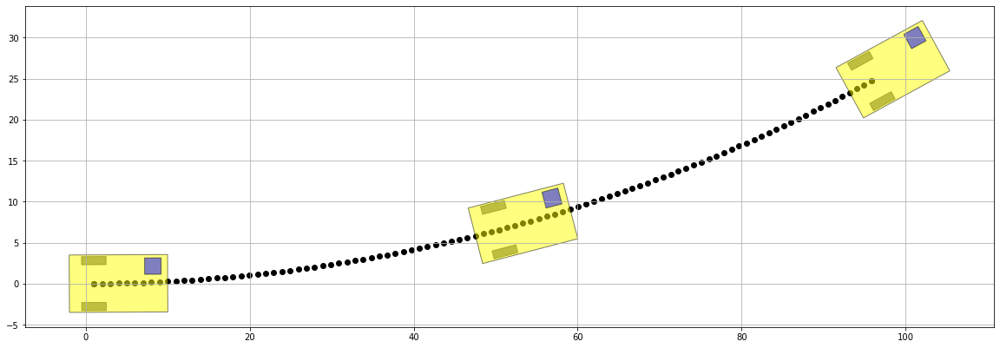

In [28]:
init_pos = [0.0, 0.0, 0.0]

vehicle = Vehicle(10.0, 0.05, 0.1)
vehicle.InitPosition( init_pos[0], init_pos[1], init_pos[2])
fig,ax = plt.subplots(figsize=[20,20])
#vehicle.PlotCurrentVehiclePosition(ax, alpha=0.5)

measurements = []

for i in range(100):
    state, true_state = vehicle.UpdateOneStep()
    measurements.append([state[0], state[1], state[2]])

    if i == 0:
        ax.scatter(true_state[0], true_state[1], color="black", label="Ground Truth")
    else:
        ax.scatter(true_state[0], true_state[1], color="black")

    if i % 50 ==0:
        vehicle.PlotCurrentVehiclePosition(ax, alpha=0.5)

vehicle.PlotCurrentVehiclePosition(ax, alpha=0.5)
ax.grid()
ax.axis('auto')
ax.set_aspect('equal')


In [29]:

ekf = MyExtendedKalmanFilter(dt_sec=0.1)
ekf.InitPosition( init_pos[0], init_pos[1], init_pos[2])

ekf.InitCovarianceMatrixP( 1, 1, 1)
ekf.InitSystemNoise( 0.1, 0.1, 1.0)
ekf.InitObserveNoise( 1.0, 1.0)
ekf.InitSimParamSystemNoise()
ekf.InitSimParamObserveNoise()


Q dummy: [[0.1        0.         0.        ]
 [0.         0.1        0.        ]
 [0.         0.         0.00174533]]
Q: [[1.0000000e-02 0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 1.0000000e-02 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 3.0461742e-06]]
R: [[1. 0.]
 [0. 1.]]
